<a href="https://colab.research.google.com/github/DavidEmeryUofC/CDS_Project_Restaurant_Rev_Prediction/blob/main/CDSproject2_PCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---

<center> <h1> <span style='color:#292D78'> CREWES Data Science Training </span> </h1> </center>

<center> <h2> <span style='color:#DF7F00'> Project: Restaurant Revenue Prediction </span> </h2> </center>

---

This [Jupyter Notebook](https://jupyter.org/install) is for analysing the data in the [Kaggle Project](https://www.kaggle.com/competitions/restaurant-revenue-prediction/discussion) for estimation of Restaurant [Revenue](https://www.kaggle.com/competitions/restaurant-revenue-prediction).  

Project members are: [David Emery](https://www.linkedin.com/in/david-emery-54659a3a/), [Nazhat Shirin Rashid](https://www.linkedin.com/in/nazhatrashid/), [Stephanie Misailidis](https://www.linkedin.com/in/stephanie-jimenez-misailidis-54a6b3b1/?originalSubdomain=ca), and [Reginaldo Moriera](https://www.linkedin.com/in/reginaldo-moreira-70a016b3/)

### Data fields
Id : Restaurant id.   
Open Date : opening date for a restaurant  
City : City that the restaurant is in. Note that there are unicode in the names.   
City Group: Type of the city. Big cities, or Other.   
Type: Type of the restaurant. FC: Food Court, IL: Inline, DT: Drive Thru, MB: Mobile  
P1, P2 - P37: There are three categories of these obfuscated data.   
- Demographic data are gathered from third party providers with GIS systems. These include population in any given area, age and gender distribution, development scales.  
- Real estate data mainly relate to the m2 of the location, front facade of the location, car park availability.  
- Commercial data mainly include the existence of points of interest including schools, banks, other QSR operators.  

Revenue: The revenue column indicates a (transformed) revenue of the restaurant in a given year and is the target of predictive analysis. Please note that the values are transformed so they don't mean real dollar values. 

In [ ]:
# Core utilities
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize': (10,7)}) # default figure size set for Powerpoint

# print plots
%matplotlib inline 

# To supress warnings and deprecated messages
import warnings
warnings.filterwarnings("ignore")


In [ ]:
# Data pre-processing
from sklearn.preprocessing import StandardScaler

# Cluster Analysis
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.cluster import DBSCAN, OPTICS
from sklearn.mixture import GaussianMixture

# Dimensionality reduction
from sklearn.decomposition import PCA

# To visualize the elbow curve
from yellowbrick.cluster import kelbow_visualizer

# To perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# To compute distances
from scipy.spatial.distance import pdist

## Import data 

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')


Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
filepath = '/content/drive/MyDrive/CDS_Course/project'
filename = filepath + '/test.csv'
print(filename)
df_test = pd.read_csv(filename)
df_test.head()

/content/drive/MyDrive/CDS_Course/project/test.csv


,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37
0,0,01/22/2011,Niğde,Other,FC,1,4.0,4.0,4.0,1,...,2.0,3.0,0,0,0,0,0,0,0,0
1,1,03/18/2011,Konya,Other,IL,3,4.0,4.0,4.0,2,...,1.0,3.0,0,0,0,0,0,0,0,0
2,2,10/30/2013,Ankara,Big Cities,FC,3,4.0,4.0,4.0,2,...,2.0,3.0,0,0,0,0,0,0,0,0
3,3,05/06/2013,Kocaeli,Other,IL,2,4.0,4.0,4.0,2,...,2.0,3.0,0,4,0,0,0,0,0,0
4,4,07/31/2013,Afyonkarahisar,Other,FC,2,4.0,4.0,4.0,1,...,5.0,3.0,0,0,0,0,0,0,0,0


In [ ]:
df_test.shape

(100000, 42)

In [ ]:
filename = filepath + '/train.csv'
print(filename)
df_train = pd.read_csv(filename)
df_train.head()

/content/drive/MyDrive/CDS_Course/project/train.csv


,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,0,07/17/1999,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,02/14/2008,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,03/09/2013,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,02/02/2012,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,05/09/2009,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,3.0,5,1,3,2,3,4,3,3,4316715.0


In [ ]:
df_train.shape

(137, 43)

The training set only contains 137 restaurant with revenue while the test data contain 100000 restaurant.

### Convert the open date to the number of days open


In [ ]:
df_train["ODate"] = pd.to_datetime(df_train["Open Date"], format = "%m/%d/%Y", utc = False)
df_test["ODate"] = pd.to_datetime(df_test["Open Date"], format = "%m/%d/%Y", utc = False)

firstopenT = pd.to_datetime(df_test["ODate"].min(), format='%Y-%m-%d', utc = False)
lastopenT = pd.to_datetime(df_test["ODate"].max(), format='%Y-%m-%d', utc = False)
print("test data",firstopenT,lastopenT)

firstopen = pd.to_datetime(df_train["ODate"].min(), format='%Y-%m-%d', utc = False)
lastopen = pd.to_datetime(df_train["ODate"].max(), format='%Y-%m-%d', utc = False)
print("train data",firstopen,lastopen)

df_train["DOpen"] = (lastopen - df_train["ODate"])/ pd.offsets.Day(1) + 365*2 
df_test["DOpen"] = (lastopen - df_test["ODate"])/ pd.offsets.Day(1) + 365*2 

test data 1995-05-08 00:00:00 2014-01-04 00:00:00
train data 1996-05-08 00:00:00 2014-01-25 00:00:00


The train data set spans from the start of 1996 to the end of 2014 (18 years). The test dataset spans 19 years and as the contest was 7 years ago might be safe to assume a minimum of 2 year open. As the training data has the newest day it will be used to determine the number of days the restaurants has been open.

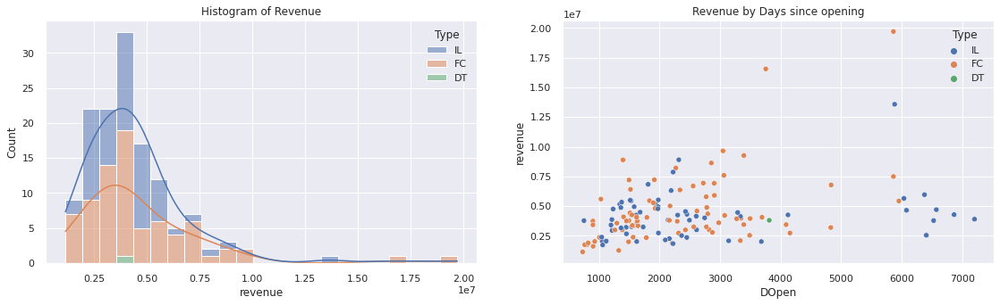

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(data=df_train, x="revenue", hue="Type", multiple="stack", kde=True, ax = ax[0]).set(title='Histogram of Revenue');
g2 = sns.scatterplot(data=df_train,x="DOpen",y="revenue", hue="Type", ax = ax[1]).set(title='Revenue by Days since opening');
fig.show();

Revenue per day assuming at least 2 years of revenue

In [ ]:
df_train['RevPday'] = df_train['revenue']/(df_train['DOpen'])

Determine the time effect on revenue using linear regression.

In [ ]:
from sklearn.linear_model import LinearRegression

# Creating the model
model_lr = LinearRegression()

# Linear model on the train data
features = ['DOpen']
model_lr.fit(df_train[features], df_train['RevPday'])
DOpenInt = model_lr.intercept_
DOpen1 = model_lr.coef_
print('Intercept is ', DOpenInt,' +', DOpen1[0],' days open')

Intercept is  3076.0029563359544  + -0.3853856757838528  days open


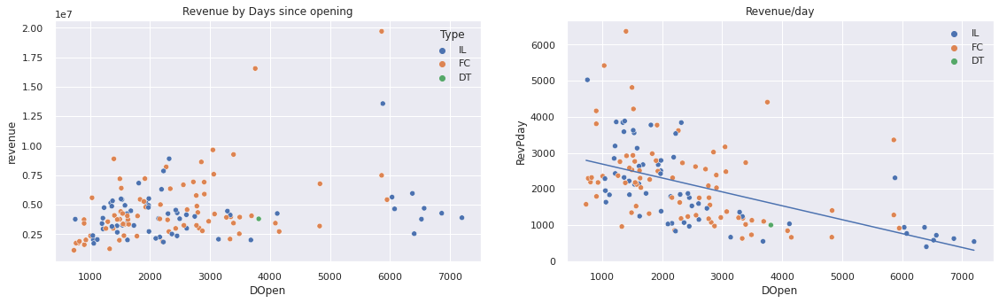

In [ ]:
DayRange = np.arange(np.min(df_train['DOpen']),np.max(df_train['DOpen']))

RevDOpen1 = DOpenInt + (DOpen1[0] * DayRange)
df_train['RevPday'] = df_train['revenue']/(df_train['DOpen'])

fig, ax = plt.subplots(1,2, figsize=(19,5) )
g1 = sns.scatterplot(data=df_train,x="DOpen",y="revenue", hue="Type", ax = ax[0]).set(title='Revenue by Days since opening');
g2 = sns.scatterplot(data=df_train,x="DOpen",y="RevPday", hue="Type", ax = ax[1]).set(title='Revenue/day')
g2 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[1]);
fig.show()

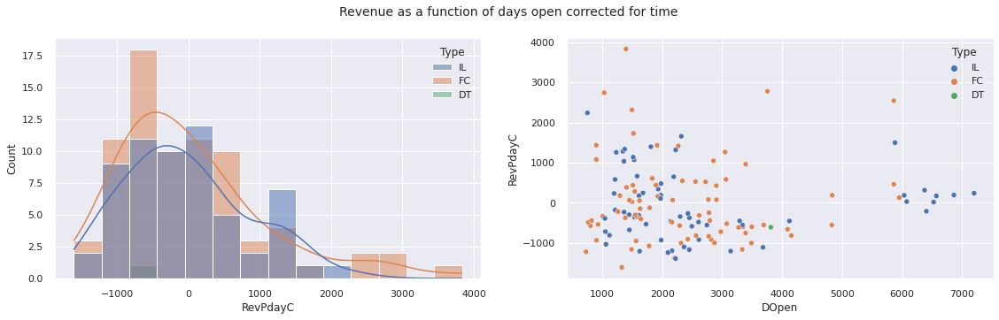

In [ ]:
df_train['RevPdayC'] = df_train['RevPday'] - (DOpenInt + (DOpen1[0] * (df_train['DOpen'])))

fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=(df_train['RevPdayC']),hue=df_train["Type"], kde=True, ax=ax[0]);
g2 = sns.scatterplot(data=df_train,x="DOpen",y="RevPdayC", hue="Type", ax=ax[1]);
plt.suptitle('Revenue as a function of days open corrected for time',fontsize=14)
fig.show();

Create 2 category field: one for City Group (1 Big/0 other) and Type ('IL' 1 remainer 0 'FC','DT','MB')

In [ ]:
# Encoding Categorical Variable for City Group and Type
cat_vars = ['City Group', 'Type']
df_train['City_Group'] = 0
df_test['City_Group'] = 0
df_train['TypeC'] = 0
df_test['TypeC'] = 0
df_train['City_Group'][df_train['City Group'] =='Big Cities'] = 1
df_test['City_Group'][df_test['City Group'] == 'Big Cities'] = 1
df_train['TypeC'][df_train['Type'] == 'IL'] = 1
df_test['TypeC'][df_test['Type'] == 'IL'] = 1

### Basic correlation analysis:

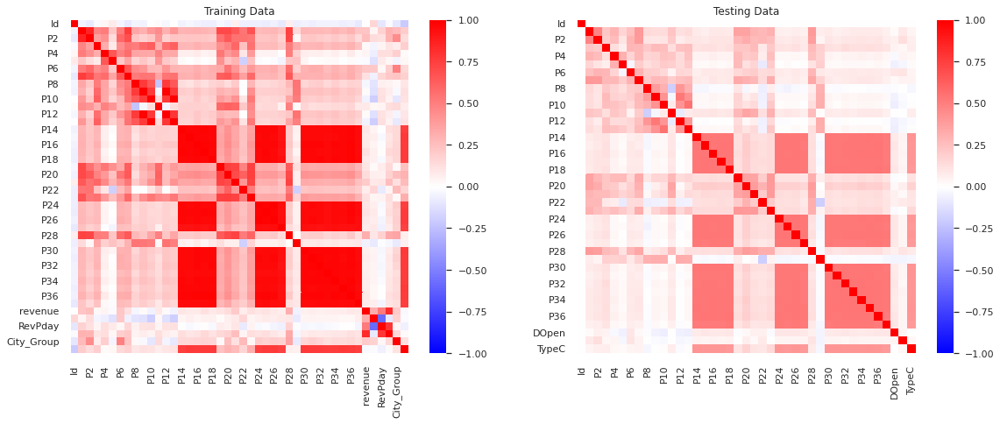

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(19, 7))
g1 = sns.heatmap(data = df_train.corr(method = "spearman"), vmin = -1, vmax = 1, annot = False, cmap ='bwr', ax=ax[0]).set(title='Training Data');
g2 = sns.heatmap(data = df_test.corr(method = "spearman"), vmin = -1, vmax = 1, annot = False, cmap ='bwr', ax=ax[1]).set(title='Testing Data');
fig.show()

In [ ]:
df_train.columns

Index(['Id', 'Open Date', 'City', 'City Group', 'Type', 'P1', 'P2', 'P3', 'P4',
       'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13', 'P14', 'P15',
       'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24', 'P25',
       'P26', 'P27', 'P28', 'P29', 'P30', 'P31', 'P32', 'P33', 'P34', 'P35',
       'P36', 'P37', 'revenue', 'ODate', 'DOpen', 'RevPday', 'RevPdayC',
       'City_Group', 'TypeC'],
      dtype='object')

In [ ]:
# Extracting names of numerical and categorical features
cols_num = list(df_train.drop(columns = ["Id","revenue",'RevPday', 'RevPdayC']).select_dtypes(include = ["int64", "float64"]))
cols_cat = list(df_train.drop(columns = ["revenue",'RevPday', 'RevPdayC']).select_dtypes(include = ["object", "category", "bool"]))

print("Numerical columns:", cols_num)
print("Categorical columns:", cols_cat)

Numerical columns: ['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13', 'P14', 'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24', 'P25', 'P26', 'P27', 'P28', 'P29', 'P30', 'P31', 'P32', 'P33', 'P34', 'P35', 'P36', 'P37', 'DOpen', 'City_Group', 'TypeC']
Categorical columns: ['Open Date', 'City', 'City Group', 'Type']


2/3 of P14-P18, P24-P27 and P30-37 are zeros, replace with nan's, standard scale and then replace nan's with zero.  To make sure that both the training and test data sets are scale equivalent merge for scaling then again seperate out the training set.

In [ ]:
df_merged = pd.concat([df_train, df_test], axis=0, ignore_index=True)

In [ ]:
df_merged.shape

(100137, 49)

In [ ]:
columnZeros = ['P14','P15','P16','P17','P18','P24','P25','P26','P27','P30','P31','P32','P33','P34','P35','P36','P37']
for i in columnZeros:
  df_merged[i][df_merged[i] == 0] = np.nan

In [ ]:
cols_scale = list(df_train.drop(columns = ["Id",'DOpen','revenue','RevPday','RevPdayC','City_Group','TypeC']).select_dtypes(include = ["int64", "float64","int8"]))

In [ ]:
df_merged.head()

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P35,P36,P37,revenue,ODate,DOpen,RevPday,RevPdayC,City_Group,TypeC
0,0,07/17/1999,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,4.0,3.0,4.0,5653753.0,1999-07-17,6036.0,936.672134,186.857117,1,1
1,1,02/14/2008,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,NaN,NaN,NaN,6923131.0,2008-02-14,2902.0,2385.641282,428.027557,1,0
2,2,03/09/2013,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,NaN,NaN,NaN,2055379.0,2013-03-09,1052.0,1953.782319,-716.794906,0,1
3,3,02/02/2012,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,12.0,12.0,6.0,2675511.0,2012-02-02,1453.0,1841.370268,-674.667301,0,1
4,4,05/09/2009,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,4.0,3.0,3.0,4316715.0,2009-05-09,2452.0,1760.487357,-370.549922,0,1


In [ ]:
rev = ['revenue','RevPday','RevPdayC']
df_merged[rev] = df_merged[rev].fillna(0)
df_merged = df_merged.fillna(df_merged.mean())

In [ ]:
from sklearn.preprocessing import StandardScaler
# Z-score
scaler = StandardScaler()
df_merged[cols_scale] = scaler.fit_transform(df_merged[cols_scale])
df_merged.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,100137.0,4.993119e+04,28906.882531,0.000000,2.489700e+04,4.993100e+04,7.496500e+04,9.999900e+04
P1,100137.0,5.165674e-17,1.000005,-1.097708,-7.422244e-01,-3.867409e-01,-3.125749e-02,3.879060e+00
P2,100137.0,1.910519e-16,1.000005,-2.398969,-2.995571e-01,4.002469e-01,4.002469e-01,2.149757e+00
P3,100137.0,7.755607e-17,1.000005,-5.003827,-2.557603e-01,-2.557603e-01,-2.557603e-01,3.898798e+00
P4,100137.0,2.853893e-16,1.000005,-2.313201,-3.823093e-01,-3.823093e-01,5.831365e-01,2.996751e+00
P5,100137.0,-5.163013e-17,1.000005,-0.928768,-9.287684e-01,9.747209e-03,9.747209e-03,5.640841e+00
P6,100137.0,5.265014e-17,1.000005,-1.228423,-5.758917e-01,-5.758917e-01,7.291701e-01,4.644355e+00
P7,100137.0,-9.486959e-17,1.000005,-1.973940,-1.380062e-01,-1.380062e-01,-1.380062e-01,2.156911e+00
P8,100137.0,1.925775e-16,1.000005,-2.287383,-5.418684e-01,3.996990e-02,3.996990e-02,2.949161e+00
P9,100137.0,1.745189e-16,1.000005,-0.735044,-7.350439e-01,-1.477817e-01,-1.477817e-01,2.788529e+00


Extract out the training data

In [ ]:
df_training = df_merged[df_merged['revenue'] > 0].copy()

## [K-Means](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) Cluster analysis

In [ ]:
features = cols_num
features.remove('DOpen')
features

['P1',
 'P2',
 'P3',
 'P4',
 'P5',
 'P6',
 'P7',
 'P8',
 'P9',
 'P10',
 'P11',
 'P12',
 'P13',
 'P14',
 'P15',
 'P16',
 'P17',
 'P18',
 'P19',
 'P20',
 'P21',
 'P22',
 'P23',
 'P24',
 'P25',
 'P26',
 'P27',
 'P28',
 'P29',
 'P30',
 'P31',
 'P32',
 'P33',
 'P34',
 'P35',
 'P36',
 'P37',
 'City_Group',
 'TypeC']

In [ ]:
model_kmeans_1 = KMeans(n_clusters = 5, random_state = 10).fit(df_merged[features])
df_merged["kmean5"] = pd.Categorical(model_kmeans_1.labels_)

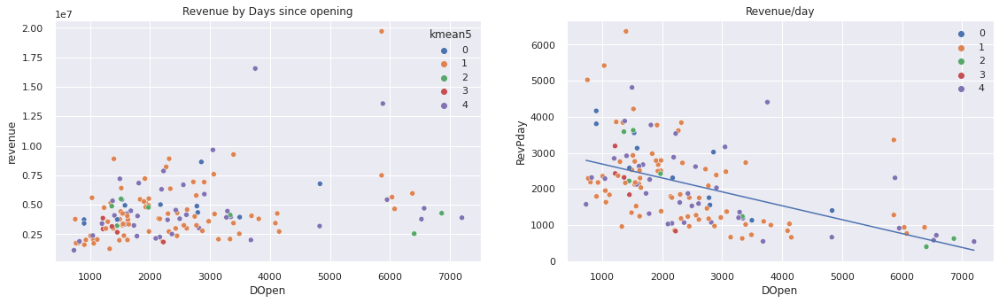

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(19,5) )
g1 = sns.scatterplot(data=df_merged[df_merged['revenue'] > 0],x="DOpen",y="revenue", hue="kmean5", ax = ax[0]).set(title='Revenue by Days since opening');
g2 = sns.scatterplot(data=df_merged[df_merged['revenue'] > 0],x="DOpen",y="RevPday", hue="kmean5", ax = ax[1]).set(title='Revenue/day')
g2 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[1]);
fig.show()

If you leave DOpen in the features clusters are dominated by time trend

K Elbow Visualizer

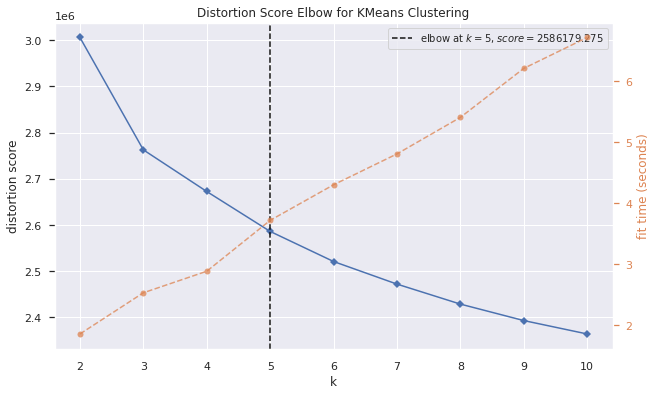

In [ ]:
plt.figure(figsize = (10,6))
kelbow_visualizer(model_kmeans_1, X = df_merged[features], y = df_merged['RevPdayC']);

## [Agglomerative](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html?highlight=agglomerative#sklearn.cluster.AgglomerativeClustering) Clustering (required more RAM than available on the non-subscribers Colab)

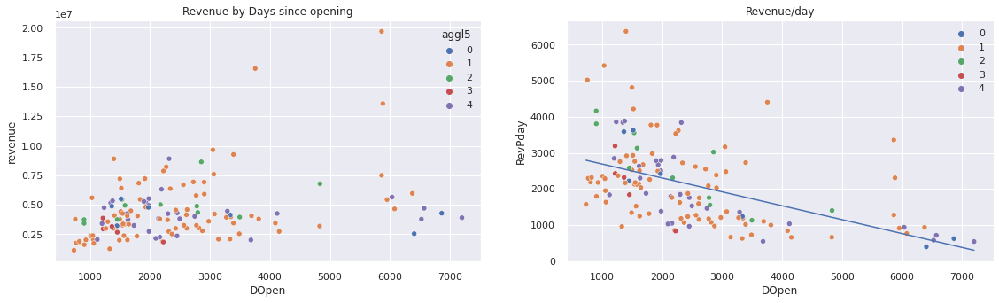

In [ ]:
# train model on the smaller subset
model_aggl_1 = AgglomerativeClustering(n_clusters = 5).fit(df_training[features])
df_training["aggl5"] = pd.Categorical(model_aggl_1.labels_)
fig, ax = plt.subplots(1,2, figsize=(19,5) )
g1 = sns.scatterplot(data=df_training[df_merged['revenue'] > 0],x="DOpen",y="revenue", hue="aggl5", ax = ax[0]).set(title='Revenue by Days since opening');
g2 = sns.scatterplot(data=df_training[df_merged['revenue'] > 0],x="DOpen",y="RevPday", hue="aggl5", ax = ax[1]).set(title='Revenue/day')
g2 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[1]);
fig.show()

## [DBScan](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html) density-based spatial clustering 

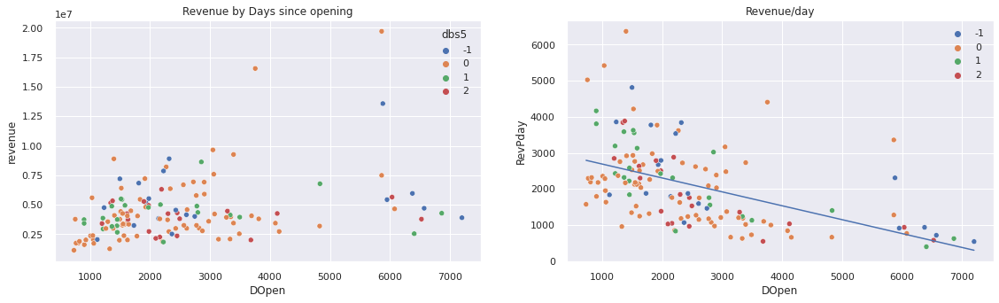

In [ ]:
# Training Model
eps = 0.35 # eps greater than 0.4 result in one cluster and less than 0.25 most points fall outside any cluster
model_dbs_1 = DBSCAN(eps = eps, min_samples = 5, metric = "cosine").fit(df_training[features])
df_training["dbs5"] = pd.Categorical(model_dbs_1.labels_)
fig, ax = plt.subplots(1,2, figsize=(19,5) )
g1 = sns.scatterplot(data=df_training[df_training['revenue'] > 0],x="DOpen",y="revenue", hue="dbs5", ax = ax[0]).set(title='Revenue by Days since opening');
g2 = sns.scatterplot(data=df_training[df_training['revenue'] > 0],x="DOpen",y="RevPday", hue="dbs5", ax = ax[1]).set(title='Revenue/day')
g2 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[1]);
fig.show()

## [Gaussian Mixture](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html?highlight=gaussian%20mixture#sklearn.mixture.GaussianMixture) clusters using a probability distribution 

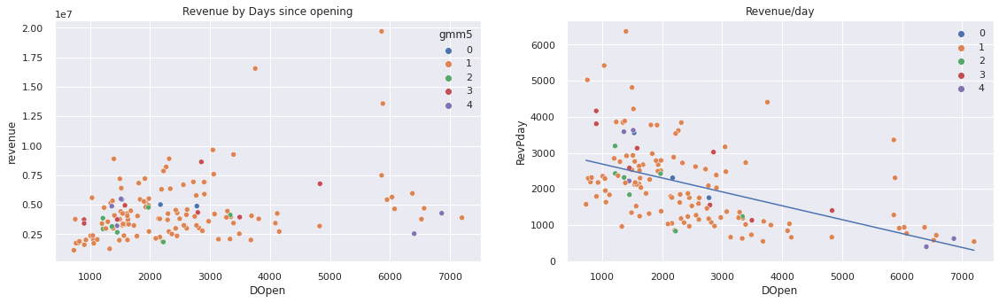

In [ ]:
# Training Model
init = "kmeans"

model_gmm = GaussianMixture(n_components = 5, n_init = 1,init_params = init,random_state = 10).fit(df_training[features])
df_training["gmm5"] = pd.Categorical(model_gmm.predict(df_training[features]))

fig, ax = plt.subplots(1,2, figsize=(19,5) )
g1 = sns.scatterplot(data=df_training[df_training['revenue'] > 0],x="DOpen",y="revenue", hue="gmm5", ax = ax[0]).set(title='Revenue by Days since opening');
g2 = sns.scatterplot(data=df_training[df_training['revenue'] > 0],x="DOpen",y="RevPday", hue="gmm5", ax = ax[1]).set(title='Revenue/day')
g2 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[1]);
fig.show()

## [PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html?highlight=pca#sklearn.decomposition.PCA) dimensionality Reduction

Text(0, 0.5, 'PCA2')

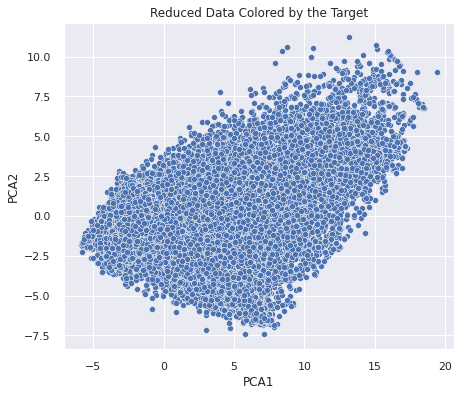

In [ ]:
pca = PCA(n_components = 2).fit(df_merged[features])
reduced_data = pca.transform(df_merged[features])

plt.figure(figsize = (7,6))
sns.scatterplot(x = reduced_data[:, 0], y = reduced_data[:, 1])
plt.title("Reduced Data Colored by the Target")
plt.xlabel("PCA1")
plt.ylabel("PCA2")

In [ ]:
df_merged.describe()

,Id,P1,P2,P3,P4,P5,P6,P7,P8,P9,...,P34,P35,P36,P37,revenue,DOpen,RevPday,RevPdayC,City_Group,TypeC
count,100137.000000,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,...,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,1.001370e+05,100137.000000,100137.000000,1.001370e+05,100137.000000,100137.000000
mean,49931.187433,5.165674e-17,1.910519e-16,7.755607e-17,2.853893e-16,-5.163013e-17,5.265014e-17,-9.486959e-17,1.925775e-16,1.745189e-16,...,2.654858e-16,8.235277e-16,-3.279635e-16,-4.528480e-16,6.092992e+03,2674.603953,2.890080,-2.134388e-16,0.492825,0.404516
std,28906.882531,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,...,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.900300e+05,1749.094750,88.291473,3.552364e+01,0.499951,0.490801
min,0.000000,-1.097708e+00,-2.398969e+00,-5.003827e+00,-2.313201e+00,-9.287684e-01,-1.228423e+00,-1.973940e+00,-2.287383e+00,-7.350439e-01,...,-1.413641e+00,-2.186379e+00,-1.780215e+00,-1.893559e+00,0.000000e+00,730.000000,0.000000,-1.606838e+03,0.000000,0.000000
25%,24897.000000,-7.422244e-01,-2.995571e-01,-2.557603e-01,-3.823093e-01,-9.287684e-01,-5.758917e-01,-1.380062e-01,-5.418684e-01,-7.350439e-01,...,-3.204655e-01,-1.786150e-01,-2.761764e-01,-4.506360e-16,0.000000e+00,1391.000000,0.000000,0.000000e+00,0.000000,0.000000
50%,49931.000000,-3.867409e-01,4.002469e-01,-2.557603e-01,-3.823093e-01,9.747209e-03,-5.758917e-01,-1.380062e-01,3.996990e-02,-1.477817e-01,...,2.427336e-16,8.916264e-16,-3.339638e-16,-4.506360e-16,0.000000e+00,2159.000000,0.000000,0.000000e+00,0.000000,0.000000
75%,74965.000000,-3.125749e-02,4.002469e-01,-2.557603e-01,5.831365e-01,9.747209e-03,7.291701e-01,-1.380062e-01,3.996990e-02,-1.477817e-01,...,2.427336e-16,8.916264e-16,-3.339638e-16,-4.506360e-16,0.000000e+00,3236.000000,0.000000,0.000000e+00,1.000000,1.000000
max,99999.000000,3.879060e+00,2.149757e+00,3.898798e+00,2.996751e+00,5.640841e+00,4.644355e+00,2.156911e+00,2.949161e+00,2.788529e+00,...,6.511879e+00,4.840796e+00,5.363970e+00,5.209635e+00,1.969694e+07,7567.000000,6371.488539,3.833484e+03,1.000000,1.000000


In [ ]:
pca = PCA(n_components = 4).fit(df_merged[features])
temp = pca.transform(df_merged[features])
PCAfeatures = ["PCA1", "PCA2", "PCA3","PCA4"]
pca_data = pd.DataFrame(temp, columns = PCAfeatures)

import plotly.express as px
fig = px.scatter_3d(pca_data, x = "PCA1", y = "PCA2", z = "PCA3")
fig.show()

In [ ]:
pca_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100137 entries, 0 to 100136
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   PCA1    100137 non-null  float64
 1   PCA2    100137 non-null  float64
 2   PCA3    100137 non-null  float64
 3   PCA4    100137 non-null  float64
dtypes: float64(4)
memory usage: 3.1 MB


Add PCA data to dataframe

In [ ]:
df_PCAmerged = pd.concat([df_merged,pca_data], axis=1)

## Kmean on PCA data

In [ ]:
model_kmeans_1 = KMeans(n_clusters = 5, random_state = 10).fit(df_PCAmerged[PCAfeatures])
df_PCAmerged["kmeanPCA"] = pd.Categorical(model_kmeans_1.labels_)
import plotly.express as px
fig = px.scatter_3d(df_PCAmerged, x = "PCA1", y = "PCA2", z = "PCA3", color = "kmeanPCA")
fig.show()

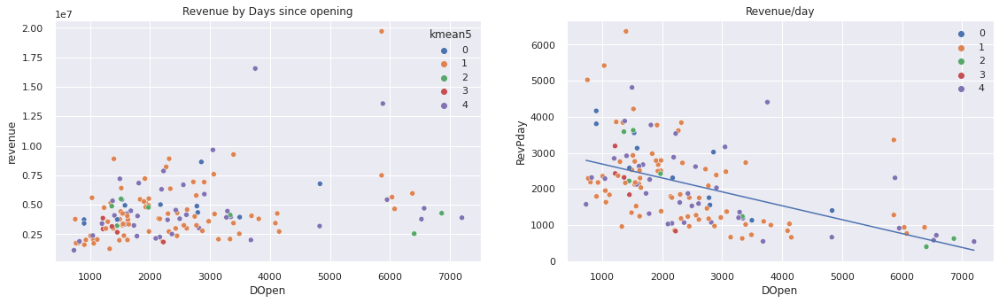

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(19,5) )
g1 = sns.scatterplot(data=df_PCAmerged[df_PCAmerged['revenue'] > 0],x="DOpen",y="revenue", hue="kmean5", ax = ax[0]).set(title='Revenue by Days since opening');
g2 = sns.scatterplot(data=df_PCAmerged[df_PCAmerged['revenue'] > 0],x="DOpen",y="RevPday", hue="kmean5", ax = ax[1]).set(title='Revenue/day')
g2 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[1]);
fig.show()

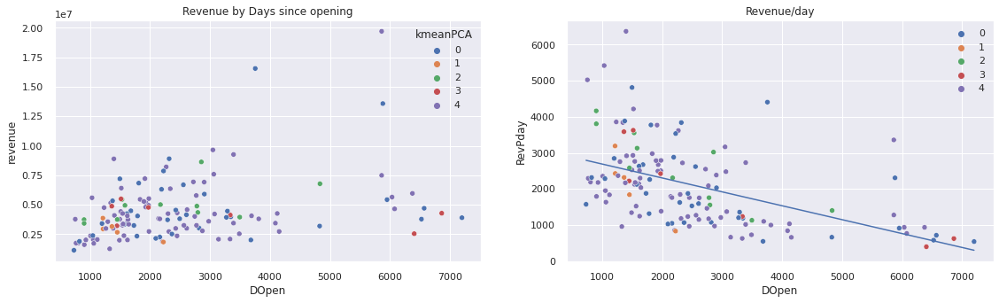

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(19,5) )
g1 = sns.scatterplot(data=df_PCAmerged[df_PCAmerged['revenue'] > 0],x="DOpen",y="revenue", hue="kmeanPCA", ax = ax[0]).set(title='Revenue by Days since opening');
g2 = sns.scatterplot(data=df_PCAmerged[df_PCAmerged['revenue'] > 0],x="DOpen",y="RevPday", hue="kmeanPCA", ax = ax[1]).set(title='Revenue/day')
g2 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[1]);
fig.show()

# Test Regression Solutions

In [ ]:
# Reduce data size back to 137 for training
df_PCAtraining = df_PCAmerged[df_PCAmerged['revenue'] > 0].copy()

In [ ]:
df_PCAtraining.describe()

,Id,P1,P2,P3,P4,P5,P6,P7,P8,P9,...,revenue,DOpen,RevPday,RevPdayC,City_Group,TypeC,PCA1,PCA2,PCA3,PCA4
count,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000,...,1.370000e+02,137.000000,137.000000,1.370000e+02,137.000000,137.000000,137.000000,137.000000,137.000000,137.000000
mean,68.000000,-0.026068,-0.013506,0.121139,-0.022910,0.016598,0.310026,0.056308,0.129157,0.113700,...,4.453533e+06,2500.262774,2112.437498,-1.593275e-13,0.569343,0.437956,0.298936,0.076369,0.334949,0.128677
std,39.692569,1.034596,1.060133,1.225401,0.981339,1.135248,1.392654,1.054197,1.081386,1.077505,...,2.576072e+06,1471.257507,1118.320886,9.639247e+02,0.496985,0.497956,4.765471,2.223070,1.658874,1.277903
min,0.000000,-1.097708,-2.398969,-5.003827,-1.347755,-0.928768,-1.228423,-1.973940,-2.287383,-0.735044,...,1.149870e+06,730.000000,398.321936,-1.606838e+03,0.000000,0.000000,-5.517748,-6.758832,-4.012893,-3.105129
25%,34.000000,-0.742224,-0.299557,-0.255760,-0.382309,-0.928768,-0.575892,-0.138006,-0.541868,-0.735044,...,2.999068e+06,1496.000000,1203.728689,-6.074356e+02,0.000000,0.000000,-1.959434,-0.609114,-0.507386,-0.474827
50%,68.000000,-0.386741,0.400247,-0.255760,-0.382309,0.009747,0.076639,-0.138006,0.039970,-0.147782,...,3.939804e+06,2162.000000,2038.554136,-2.460790e+02,1.000000,0.000000,-1.205041,0.757377,0.557920,-0.127443
75%,102.000000,-0.031257,0.400247,0.931256,0.583137,0.009747,0.729170,-0.138006,0.039970,-0.147782,...,5.166635e+06,2977.000000,2722.824561,4.416904e+02,1.000000,1.000000,-0.582679,1.085911,1.208492,0.564250
max,136.000000,2.812610,2.149757,3.898798,2.996751,5.640841,4.644355,2.156911,2.949161,2.788529,...,1.969694e+07,7201.000000,6371.488539,3.833484e+03,1.000000,1.000000,19.383628,9.042212,7.162918,5.931659


In [ ]:
X = df_PCAtraining[PCAfeatures]
y = df_PCAtraining['RevPdayC']  #choose are 'revenue', 'RevPday','RevPdayC'
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.linear_model import LinearRegression
#from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor,plot_importance
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import cross_val_score

regressors = [
    ('Linear Regression' , LinearRegression(fit_intercept=False)),
    ('RIDGE Regression' , RidgeCV(fit_intercept=False)),
    ('LASSO Regression' , LassoCV(fit_intercept=False)),
    ('Linear SVR',LinearSVR(fit_intercept=False)),
    ('Support Vector Machines' , SVR()),
    ('Decision Tree' , DecisionTreeRegressor()),
    ('Random Forest' , RandomForestRegressor(n_estimators=400,oob_score=True,max_features=0.7)),
    ('K-nearest Neighbors' , KNeighborsRegressor()),
    ('SKlearn HistGBoost', HistGradientBoostingRegressor()),
    ('XGBoost' , XGBRegressor()),
    ('Gaussian', GaussianProcessRegressor())
]
results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  #print(func)
  model = func.fit(X_train, y_train)
  pred = model.predict(X_test)
  results.loc[method]= [mean_absolute_error(y_test,pred),
                          mean_squared_error(y_test,pred),
                          r2_score(y_test,pred)
                         ]
results

[20:08:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


,MAE,MSE,R2-score
Linear Regression,699.256650,8.292887e+05,-0.004332
RIDGE Regression,699.204940,8.272260e+05,-0.001834
LASSO Regression,709.527477,8.210240e+05,0.005677
Linear SVR,715.634235,8.259294e+05,-0.000264
Support Vector Machines,701.977471,8.513907e+05,-0.031099
Decision Tree,743.609313,8.492805e+05,-0.028544
Random Forest,743.838683,7.671693e+05,0.070899
K-nearest Neighbors,841.000518,1.065498e+06,-0.290399
SKlearn HistGBoost,768.381786,8.027547e+05,0.027803
XGBoost,765.199334,8.193249e+05,0.007735
